# **SYRIATEL PREDICTIVE ANALYSIS OF CUSTOMER CHURN**

### **Student Name**: Winny Chemusian                                     
### **Student Pace**: Part-time
### **Instructors**:
###             1.Noah Kandie
###             2.William Okomba

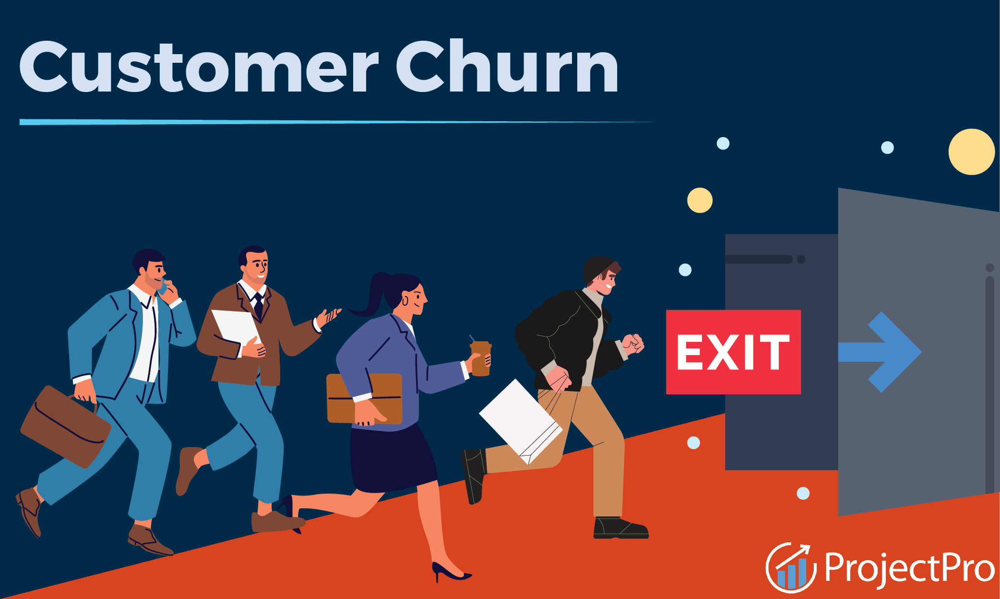!

# 1.Business Understanding

#### 1.1 Project Overview

This project analyzes SyriaTel data and builds models that predict whether a customer will churn or not.

#### 1.2 Introduction

SyriaTel, a telecommunications company bases in Damascus Syria, encounters a notable obstacle in curtailing customer churn, which can detrimentally affect its revenue and overall profitability. The telecommunications industry is highly competitive, with companies vying for market share and profitability. Customer retention is crucial for sustained success, as high churn rates can significantly impact revenue and profitability. Understanding its market position, customer demographics, and competitive environment is essential for devising effective churn prediction strategies.Identifying common indicators such as usage patterns, billing history, and customer service interactions is crucial for predicting and preventing churn.Different customer segments may exhibit varying churn behaviors. Understanding these differences allows for targeted retention efforts and personalized marketing strategies tailored to specific customer groups.

#### 1.3 Business stakeholders

The primary stakeholder in this project is SyrialTel, a telecommunications company based in Damascus, Syria. Their core interest lies in understanding the patterns and reasons behind customer churn. By comprehensively understanding why customers leave, SyrialTel can take proactive measures to retain them. This includes improving service quality, enhancing customer support, and offering tailored solutions to address customer needs. By leveraging data-driven insights, SyrialTel can make informed decisions, tailor services, and allocate resources effectively to reduce churn. This proactive approach not only improves customer satisfaction but also leads to financial savings by minimizing revenue loss associated with customers discontinuing their services.

#### 1.4 Objectives

The primary objectives of this project are as follows:

- To Build a classification model to predict customer churn for SyriaTel.
  
- To Identify the key factors influencing customer churn.
  
- To Provide insights and recommendations to SyriaTel for effective churn management.

### 1.5 Project Methodology

- The CRISP-DM (Cross-Industry Standard Process for Data Mining) methodology is a widely used framework for data mining projects, and it can be effectively applied to customer churn analysis. The methodology consists of six phases: Business Understanding, Data Understanding, Data Preparation, Modeling, Evaluation, and Deployment.

The processes to be undertaken in this project are:

- Data Understanding
- Data Cleaning
- Exploratory Data Analysis
- Data Preparation
- Modelling
- Evaluation
- Conclusion

### 1.6 Problem Statement

Our stakeholder will be SyriaTel which is a leading telecommunications company that is experiencing a significant churn rate among its customer base. Churn, the rate at which customers cease using SyriaTel's services, poses a substantial financial challenge and threatens the company's long-term sustainability. To mitigate revenue loss and improve customer retention, SyriaTel aims to develop a predictive model that can accurately identify customers at risk of churn.By addressing the problem of customer churn through predictive analytics, SyriaTel aims to secure its position in the telecommunications market and drive sustainable growth in the long term.

#### 1.7 Success Metric

In this analysis the metric used will be ROC AUC  as it measures the model's ability to discriminate between the positive class (churn) and the negative class (non-churn). This metric offesr a comprehensive assessment of a binary classifier's performance, helping stakeholders understand its ability to discriminate between churn and non-churn instances and make informed decisions regarding model deployment and optimization. 

### 2.Data Understanding

#### 2.1 Data Description

The data utilized for this project has been sourced from [Kaggle](https://www.kaggle.com/becksddf/churn-in-telecoms-dataset).
The dataset contains 3333 entries and 21 columns, including information about the state, account length, area code, phone number, international plan, voice mail plan, number of voice mail messages, total day minutes, total day calls, total day charge, total evening minutes, total evening calls, total evening charge, total night minutes, total night calls, total night charge, total international minutes, total international calls, total international charge, customer service calls and churn.

#### 2.2 Importing Libraries, Loading and Checking the data set.

In [3]:
#Import required libraries
import pandas as pd
%matplotlib inline 
from IPython.display import Image
import matplotlib.pyplot as mlp
import matplotlib.pyplot as plt
import numpy as np
import os
import sklearn
import seaborn as sns
from sklearn.model_selection import cross_validate
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
from sklearn import preprocessing
import warnings

In [67]:
#Loading the dataset
df=pd.read_csv('bigml_59c28831336c6604c800002a.csv')

In [68]:
# Creating a copy of the dataset to work with.
df_copy = df.copy()

In [69]:
## Checking the dataset
df.head(5)

,state,account length,area code,phone number,international plan,voice mail plan,number vmail messages,total day minutes,total day calls,total day charge,...,total eve calls,total eve charge,total night minutes,total night calls,total night charge,total intl minutes,total intl calls,total intl charge,customer service calls,churn
0,KS,128,415,382-4657,no,yes,25,265.1,110,45.07,...,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False
1,OH,107,415,371-7191,no,yes,26,161.6,123,27.47,...,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False
2,NJ,137,415,358-1921,no,no,0,243.4,114,41.38,...,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False
3,OH,84,408,375-9999,yes,no,0,299.4,71,50.90,...,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False
4,OK,75,415,330-6626,yes,no,0,166.7,113,28.34,...,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False


In [5]:
# checking the shape of the data
print(f"The data has {df.shape[0]} rows and {df.shape[1]} columns")

The data has 3333 rows and 21 columns


In [6]:
# checking for the information about the data Frame.
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3333 entries, 0 to 3332
Data columns (total 21 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   state                   3333 non-null   object 
 1   account length          3333 non-null   int64  
 2   area code               3333 non-null   int64  
 3   phone number            3333 non-null   object 
 4   international plan      3333 non-null   object 
 5   voice mail plan         3333 non-null   object 
 6   number vmail messages   3333 non-null   int64  
 7   total day minutes       3333 non-null   float64
 8   total day calls         3333 non-null   int64  
 9   total day charge        3333 non-null   float64
 10  total eve minutes       3333 non-null   float64
 11  total eve calls         3333 non-null   int64  
 12  total eve charge        3333 non-null   float64
 13  total night minutes     3333 non-null   float64
 14  total night calls       3333 non-null   

In [60]:
# Check the data types of each column
print("Data types of each column:")
print(df.dtypes)

Data types of each column:
international plan          int32
voice mail plan             int32
number vmail messages       int64
total day minutes         float64
total day calls             int64
total day charge          float64
total eve minutes         float64
total eve calls             int64
total eve charge          float64
total night minutes       float64
total night calls           int64
total night charge        float64
total intl minutes        float64
total intl calls            int64
total intl charge         float64
customer service calls      int64
churn                       int64
Total Charge              float64
Total Minutes             float64
total calls                 int64
dtype: object


In [7]:
# checking for the unique values in the data
for i in df.columns:
    print(f"Unique values in {i} are {df[i].nunique()}")

Unique values in state are 51
Unique values in account length are 212
Unique values in area code are 3
Unique values in phone number are 3333
Unique values in international plan are 2
Unique values in voice mail plan are 2
Unique values in number vmail messages are 46
Unique values in total day minutes are 1667
Unique values in total day calls are 119
Unique values in total day charge are 1667
Unique values in total eve minutes are 1611
Unique values in total eve calls are 123
Unique values in total eve charge are 1440
Unique values in total night minutes are 1591
Unique values in total night calls are 120
Unique values in total night charge are 933
Unique values in total intl minutes are 162
Unique values in total intl calls are 21
Unique values in total intl charge are 162
Unique values in customer service calls are 10
Unique values in churn are 2


In [70]:
df = df.drop(columns=['account length', 'area code', 'state', 'phone number'])

## 3 Data Cleaning

#### 3.1 Handling Missing Values

In [11]:
#Checking missing values
df.isna().sum()

international plan        0
voice mail plan           0
number vmail messages     0
total day minutes         0
total day calls           0
total day charge          0
total eve minutes         0
total eve calls           0
total eve charge          0
total night minutes       0
total night calls         0
total night charge        0
total intl minutes        0
total intl calls          0
total intl charge         0
customer service calls    0
churn                     0
dtype: int64

There are no missing values in our data set

In [71]:
### Analysis of the Numerical and Descriptive data
numerical_attributes = df.select_dtypes(include=['int64','float64'])
categorical_attributes = df.select_dtypes(exclude=['int64','float64'])

#### 3.2 Checking for Outliers

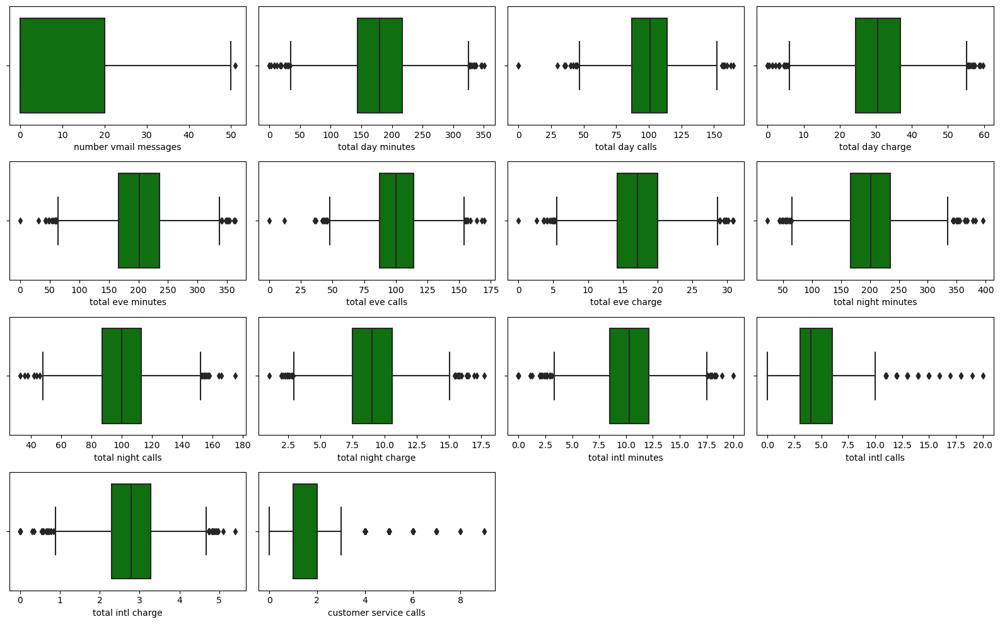

In [46]:
#Checking for outliers
import warnings

# Ignore all warnings
warnings.filterwarnings("ignore")

# Create box plots for each numerical column
plt.figure(figsize=(16, 10))
for i, column in enumerate(numerical_attributes, 1):
    plt.subplot(4, 4, i)
    sns.boxplot(x=df[column], palette=['green'])
    plt.xlabel(column)
plt.tight_layout()
plt.show()

#### 3.3 Checking for Duplicates

In [14]:
#Checking for duplicates
df.duplicated().sum()

0

Our data contains no duplicates

## 4.Exploratory Data Analysis

#### 4.1 Summary Statistic

In [61]:
# Summary statistic
df.describe()

,international plan,voice mail plan,number vmail messages,total day minutes,total day calls,total day charge,total eve minutes,total eve calls,total eve charge,total night minutes,total night calls,total night charge,total intl minutes,total intl calls,total intl charge,customer service calls,churn,Total Charge,Total Minutes,total calls
count,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000
mean,0.096910,0.276628,8.099010,179.775098,100.435644,30.562307,200.980348,100.114311,17.083540,200.872037,100.107711,9.039325,10.237294,4.479448,2.764581,1.562856,0.144914,59.449754,591.864776,305.137114
std,0.295879,0.447398,13.688365,54.467389,20.069084,9.259435,50.713844,19.922625,4.310668,50.573847,19.568609,2.275873,2.791840,2.461214,0.753773,1.315491,0.352067,10.502261,89.954251,34.448164
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,23.200000,33.000000,1.040000,0.000000,0.000000,0.000000,0.000000,0.000000,22.930000,284.300000,191.000000
25%,0.000000,0.000000,0.000000,143.700000,87.000000,24.430000,166.600000,87.000000,14.160000,167.000000,87.000000,7.520000,8.500000,3.000000,2.300000,1.000000,0.000000,52.380000,531.500000,282.000000
50%,0.000000,0.000000,0.000000,179.400000,101.000000,30.500000,201.400000,100.000000,17.120000,201.200000,100.000000,9.050000,10.300000,4.000000,2.780000,1.000000,0.000000,59.470000,593.600000,305.000000
75%,0.000000,1.000000,20.000000,216.400000,114.000000,36.790000,235.300000,114.000000,20.000000,235.300000,113.000000,10.590000,12.100000,6.000000,3.270000,2.000000,0.000000,66.480000,652.400000,328.000000
max,1.000000,1.000000,51.000000,350.800000,165.000000,59.640000,363.700000,170.000000,30.910000,395.000000,175.000000,17.770000,20.000000,20.000000,5.400000,9.000000,1.000000,96.150000,885.000000,416.000000


#### 4.2 Univariate Analysis 

In this section we will assess the distribution all variables

This classification problem project seeks to predict the churn of customers. The target variable is "churn" which is a binary variable. Assesing the distribution of the target variable to see if the data is balanced or not.

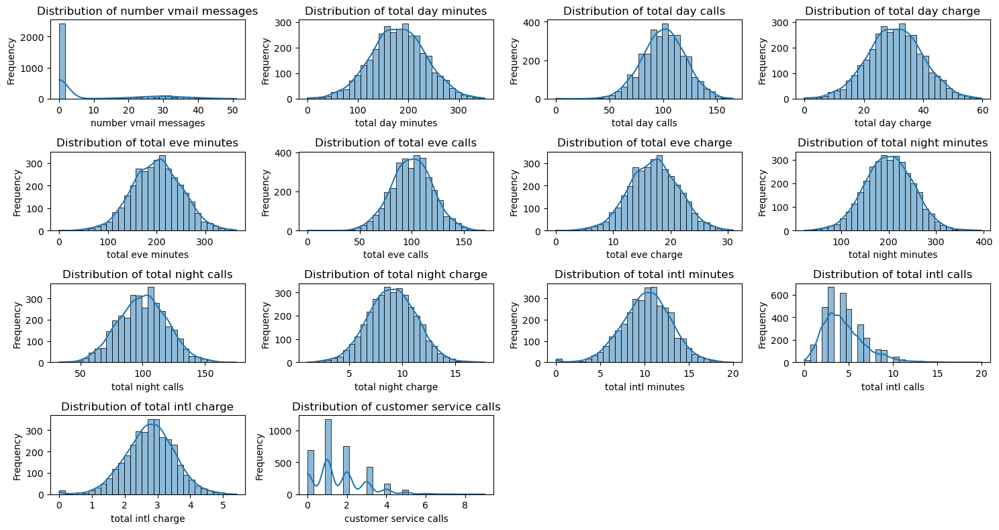

In [28]:
# Plotting the distribution of numerical features
# Determine the number of rows and columns for subplots
num_plots = len(numerical_attributes)
num_rows = 4  # Adjust as needed
num_cols = num_plots // num_rows + (1 if num_plots % num_rows > 0 else 0)

# Create subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 8))

# Flatten axes if necessary
if num_plots == 1:
    axes = [axes]

# Plot histograms
for i, column in enumerate(numerical_attributes):
    sns.histplot(data=df, x=column, bins=30, kde=True, ax=axes[i // num_cols, i % num_cols])
    axes[i // num_cols, i % num_cols].set_title(f'Distribution of {column}')
    axes[i // num_cols, i % num_cols].set_xlabel(column)
    axes[i // num_cols, i % num_cols].set_ylabel('Frequency')

# Remove any empty subplots
for i in range(num_plots, num_rows * num_cols):
    axes[i // num_cols, i % num_cols].axis('off')

plt.tight_layout()
plt.show()

Most of the features are normally distributed except for number of voicemail messages, total intl calls and customer service calls
which are left skewed.

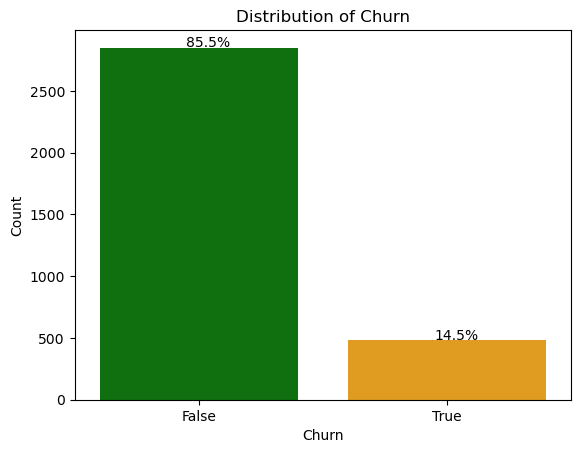

In [23]:
# Plotting the distribution of the target variable
ax = sns.countplot(x='churn', data=df, palette=['green', 'orange'])
total = len(df['churn'])
for p in ax.patches:
    percentage = '{:.1f}%'.format(100 * p.get_height() / total)
    x = p.get_x() + p.get_width() / 2 - 0.05
    y = p.get_height() + 5
    ax.annotate(percentage, (x, y), color='black')

plt.title('Distribution of Churn')
plt.xlabel('Churn')
plt.ylabel('Count')

plt.show()

- Approximately 14.5 % of the total customers  have churned from SyriaTel indicating a loss in their customer base.

- From the distribution as shown in "Distribution of churn" graph above, their is an uneven distribution of observations with 85.5% of the data belonging to the False class while 14.5% belonging to the true class.

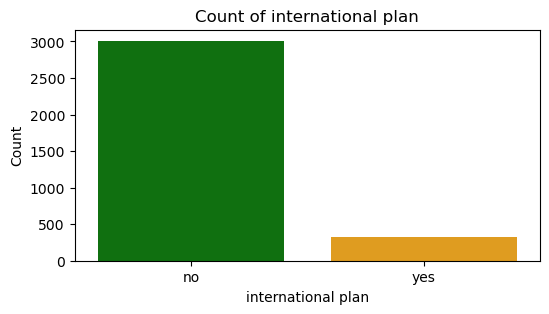

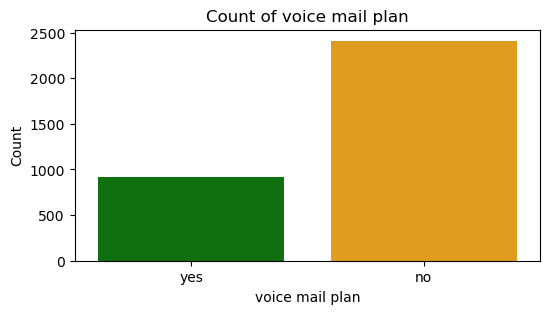

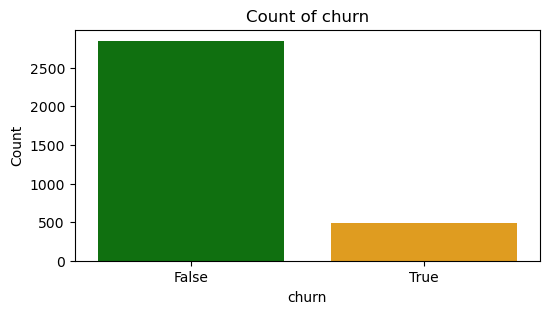

In [24]:
# Plotting count of categorical features
for feature in categorical_attributes:
    plt.figure(figsize=(6, 3))
    sns.countplot(data=df, x=feature, palette=['green', 'orange'])
    plt.title(f'Count of {feature}')
    plt.xlabel(feature)
    plt.ylabel('Count')
    plt.show()

- Voice mail plan has a small effect on customer churning.

- International call plan has an effect on customer churning, as most of the customer who churn, do not have active plan subscription. 

#### 4.3 Bivariate Analysis

In this section we will examine the relationships between our target variable-price and other attributes in the dataset. This will help us understand how one variable affects or is affected by the other variables.

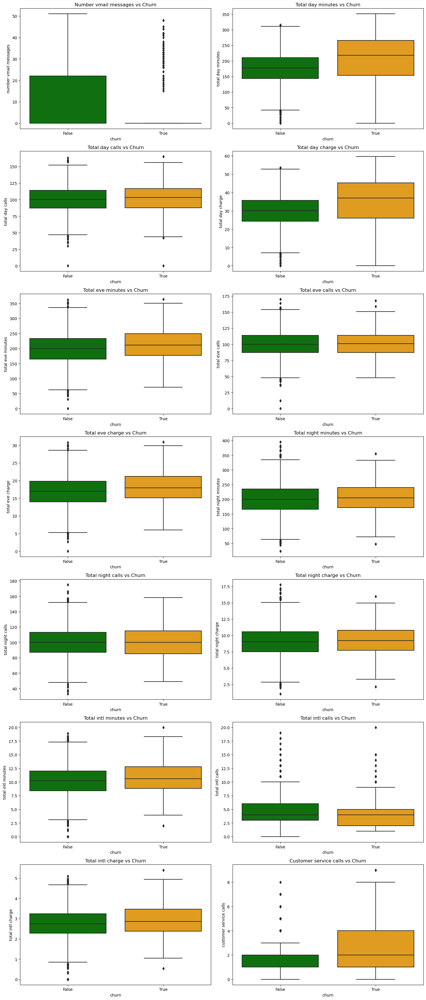

In [32]:
# Plotting bivariate analysis with the target variable (churn)
# Get numerical attributes
numerical_attributes = df.select_dtypes(include=['int64', 'float64']).columns

# Number of numerical attributes
num_numerical = len(numerical_attributes)

# Define the number of rows and columns for the subplots
num_cols = 2  # Number of columns
num_rows = (num_numerical + 1) // num_cols  # Number of rows, ensuring enough space for all plots

# Create the subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, num_rows * 5))

# Flatten axes for easy iteration
axes = axes.flatten()

# Bivariate analysis for numerical features
for i, feature in enumerate(numerical_attributes):
    sns.boxplot(x='churn', y=feature, data=df, palette=['green', 'orange'], ax=axes[i])
    axes[i].set_title(f'{feature.capitalize()} vs Churn')

# Remove any empty subplots
for j in range(i + 1, num_rows * num_cols):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

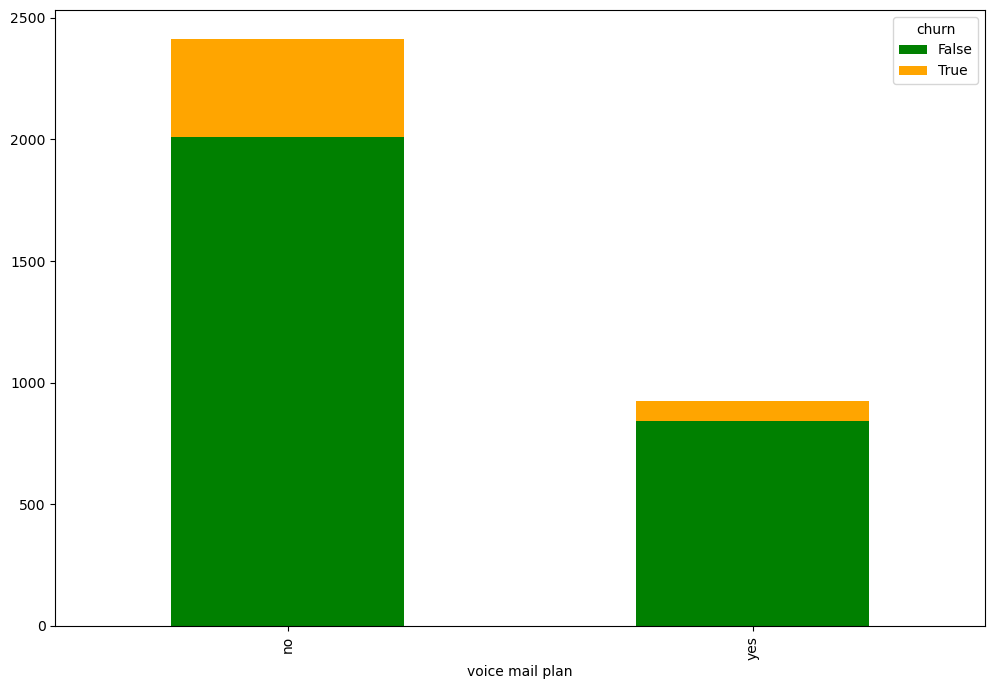

The number of customers subscribed to the voice mail plan : 27.66%
The number of subscribed customers who churned with voice mail plan : 8.68%


In [41]:
#Checking for the impact of the voice mail plan on churn

# Function to take different plans
def plot_churn_vs_plan(df, plan_column):
    # Plotting the churn vs plan with blue and red bars
    df.groupby([plan_column, 'churn']).size().unstack().plot(
        kind='bar', stacked=True, figsize=(12,8), color=['green', 'orange'])
    plt.show()

    # Calculating the percentage of customers subscribed to the plan
    total_customers = len(df)
    total_subscribed = sum(df[plan_column] == 'yes')
    percentage_subscribed = (total_subscribed / total_customers) * 100
    print('The number of customers subscribed to the {} : {:.2f}%'.format(plan_column, percentage_subscribed))

    # Calculating the percentage of churned customers among those subscribed to the plan
    churned_with_plan = sum((df[plan_column] == 'yes') & (df['churn'] == True))
    percentage_churned_with_plan = (churned_with_plan / total_subscribed) * 100
    print('The number of subscribed customers who churned with {} : {:.2f}%'.format(plan_column, percentage_churned_with_plan))

# Plot churn vs plan for 'voice mail plan'
plot_churn_vs_plan(df, 'voice mail plan')

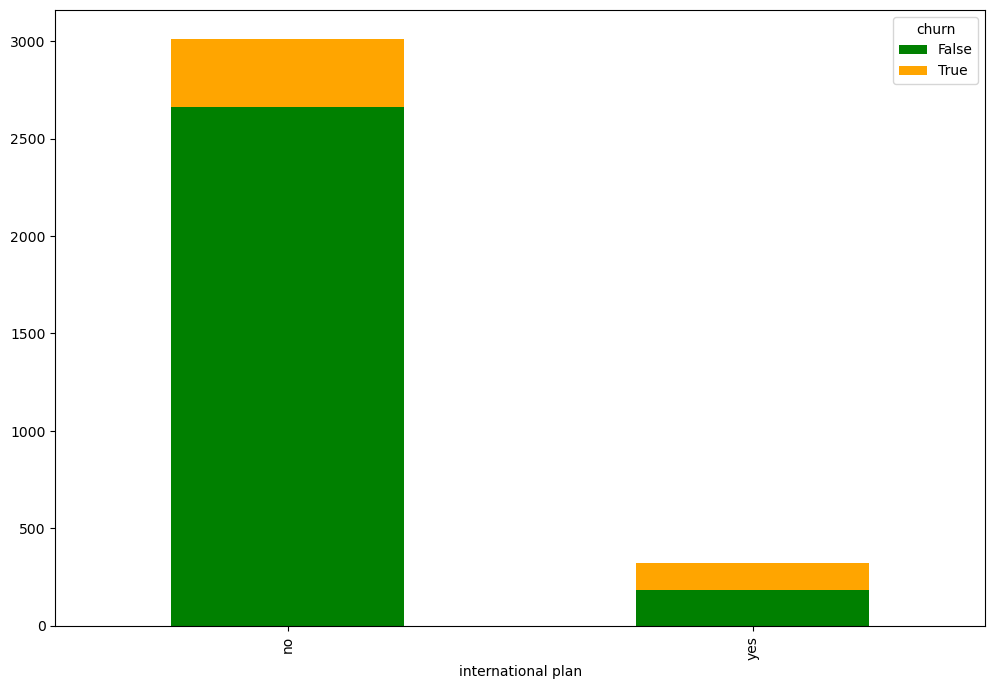

The number of customers subscribed to the international plan : 9.69%
The number of subscribed customers who churned with international plan : 42.41%


In [42]:
plot_churn_vs_plan(df,'international plan')

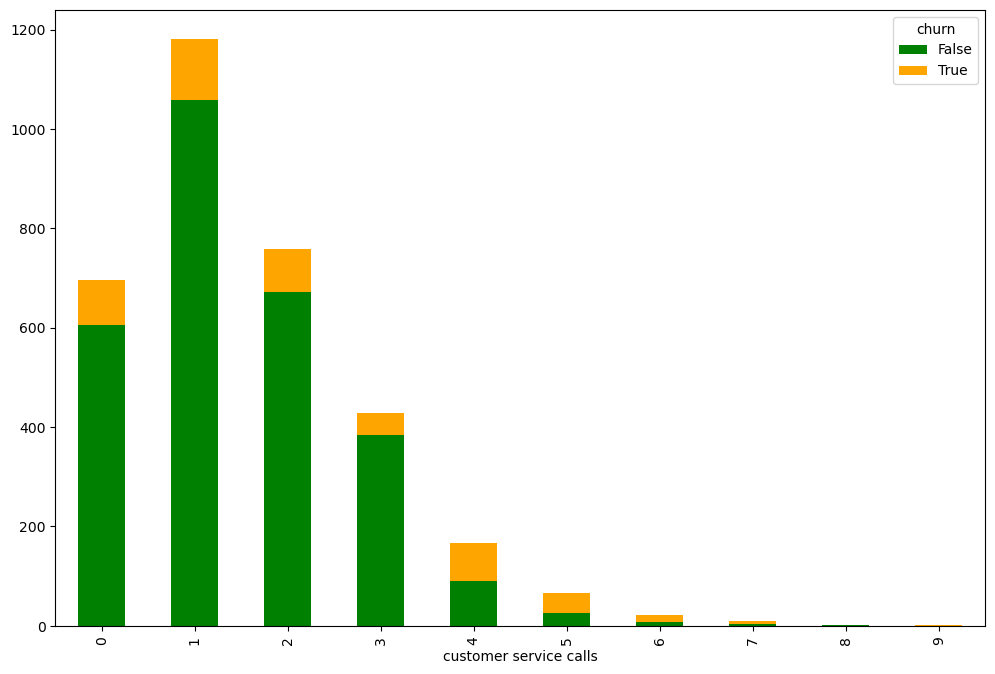

The number of customers subscribed to the customer service calls : 0.00%


ZeroDivisionError: division by zero

In [44]:
# Ignore all warnings
warnings.filterwarnings("ignore")

plot_churn_vs_plan(df,'customer service calls')

#### 4.4 Multivariate analysis

We check for multicollinearity of features to enhance accuracy during modeling.

In [72]:
from sklearn.preprocessing import LabelEncoder

# Assuming you have a DataFrame named 'df' containing your dataset

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Define the columns to be label encoded
columns_to_encode = ['international plan', 'voice mail plan', 'churn']

# Apply label encoding to each column
for column in columns_to_encode:
    df[column] = label_encoder.fit_transform(df[column])

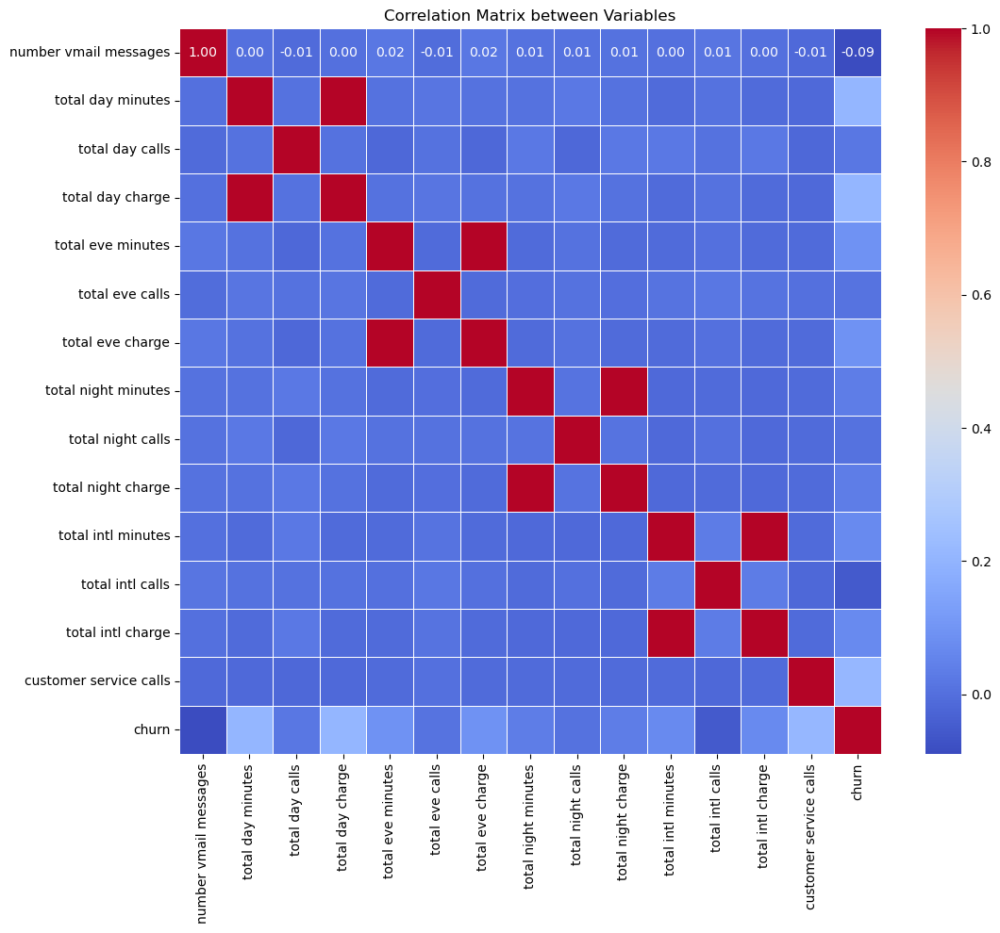

In [48]:
# Compute the correlation matrix for the numerical columns
numerical_attributes = df.select_dtypes(include=['float64', 'int64']).columns.tolist()
corr_matrix = df[numerical_attributes].corr()

# Generate the correlation heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Matrix between Variables')
plt.show()

In [49]:
# Print correlation coefficients
corr_matrix

,number vmail messages,total day minutes,total day calls,total day charge,total eve minutes,total eve calls,total eve charge,total night minutes,total night calls,total night charge,total intl minutes,total intl calls,total intl charge,customer service calls,churn
number vmail messages,1.000000,0.000778,-0.009548,0.000776,0.017562,-0.005864,0.017578,0.007681,0.007123,0.007663,0.002856,0.013957,0.002884,-0.013263,-0.089728
total day minutes,0.000778,1.000000,0.006750,1.000000,0.007043,0.015769,0.007029,0.004323,0.022972,0.004300,-0.010155,0.008033,-0.010092,-0.013423,0.205151
total day calls,-0.009548,0.006750,1.000000,0.006753,-0.021451,0.006462,-0.021449,0.022938,-0.019557,0.022927,0.021565,0.004574,0.021666,-0.018942,0.018459
total day charge,0.000776,1.000000,0.006753,1.000000,0.007050,0.015769,0.007036,0.004324,0.022972,0.004301,-0.010157,0.008032,-0.010094,-0.013427,0.205151
total eve minutes,0.017562,0.007043,-0.021451,0.007050,1.000000,-0.011430,1.000000,-0.012584,0.007586,-0.012593,-0.011035,0.002541,-0.011067,-0.012985,0.092796
total eve calls,-0.005864,0.015769,0.006462,0.015769,-0.011430,1.000000,-0.011423,-0.002093,0.007710,-0.002056,0.008703,0.017434,0.008674,0.002423,0.009233
total eve charge,0.017578,0.007029,-0.021449,0.007036,1.000000,-0.011423,1.000000,-0.012592,0.007596,-0.012601,-0.011043,0.002541,-0.011074,-0.012987,0.092786
total night minutes,0.007681,0.004323,0.022938,0.004324,-0.012584,-0.002093,-0.012592,1.000000,0.011204,0.999999,-0.015207,-0.012353,-0.015180,-0.009288,0.035493
total night calls,0.007123,0.022972,-0.019557,0.022972,0.007586,0.007710,0.007596,0.011204,1.000000,0.011188,-0.013605,0.000305,-0.013630,-0.012802,0.006141
total night charge,0.007663,0.004300,0.022927,0.004301,-0.012593,-0.002056,-0.012601,0.999999,0.011188,1.000000,-0.015214,-0.012329,-0.015186,-0.009277,0.035496


While most of the features in the dataset do not show significant correlation, there are some pairs of features that exhibit perfect positive correlation. This are:

- Total day charge and Total day minutes,
- Total eve charge and Total eve minutes,
- Total night charge and Total night minutes,
- Total int charge and Total int minutes.

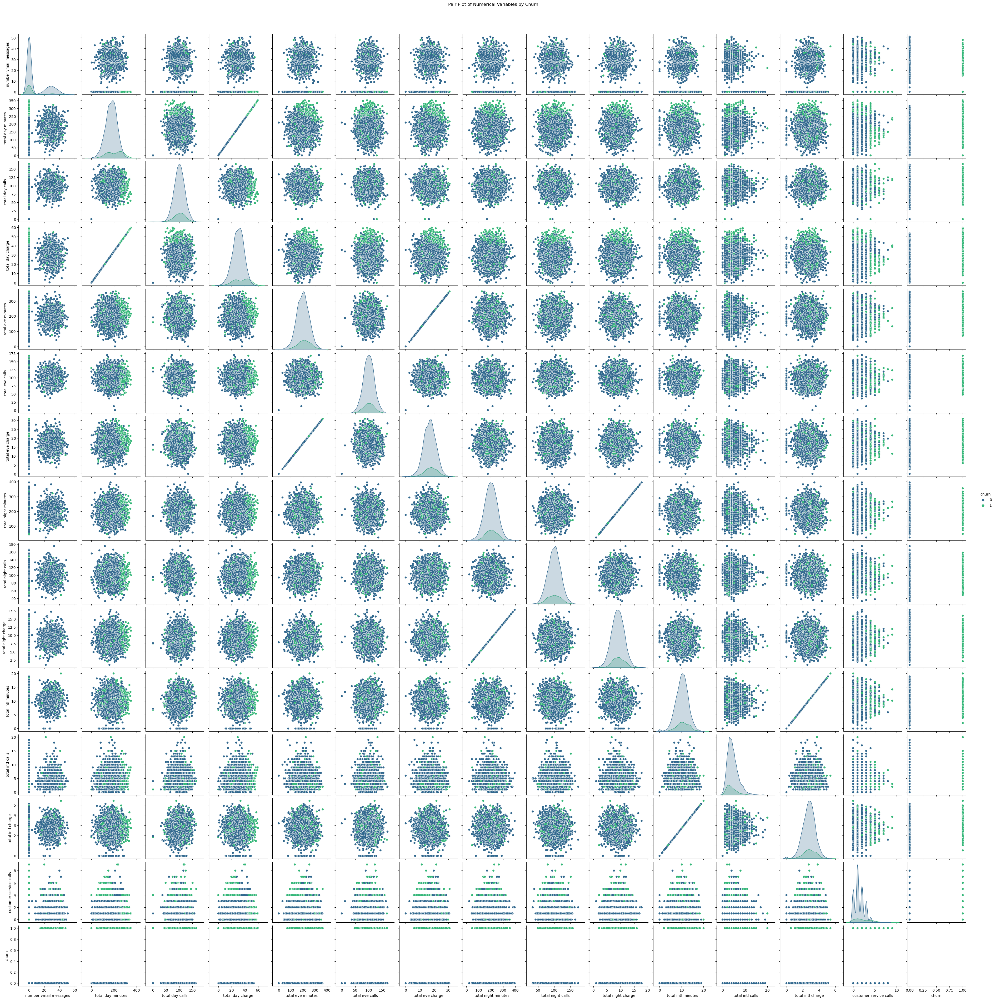

In [50]:
# Create a pair plot (scatterplot matrix)
sns.pairplot(df, vars=numerical_attributes, hue='churn', palette='viridis')
plt.suptitle('Pair Plot of Numerical Variables by Churn', y=1.02)
plt.show()

#### 4.5 Feature Engineering

Feature engineering involves creating new features from existing ones to improve model performance or extract more meaningful information from the data. In this case, i have added two columns ('Total Charge', Total calls and 'Total Minutes') by combining existing columns related to charges and minutes.

In [105]:
# Add columns for charges and create a new colums for totals
df['Total Charge'] = df['total day charge'] + df['total eve charge'] + df['total night charge'] + df['total intl charge']
df['Total Minutes'] = df['total day minutes'] + df['total eve minutes'] + df['total night minutes'] + df['total intl minutes']
df['total calls'] = df['total day calls'] + df['total eve calls'] + df['total night calls']+ df['total intl calls']

# Display the updated DataFrame
df.head(3)

,international plan,voice mail plan,number vmail messages,total day minutes,total day calls,total day charge,total eve minutes,total eve calls,total eve charge,total night minutes,total night calls,total night charge,total intl minutes,total intl calls,total intl charge,customer service calls,churn,Total Charge,Total Minutes,total calls
0,0,1,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,0,75.56,717.2,303
1,0,1,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,0,59.24,625.2,332
2,0,0,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,0,62.29,539.4,333


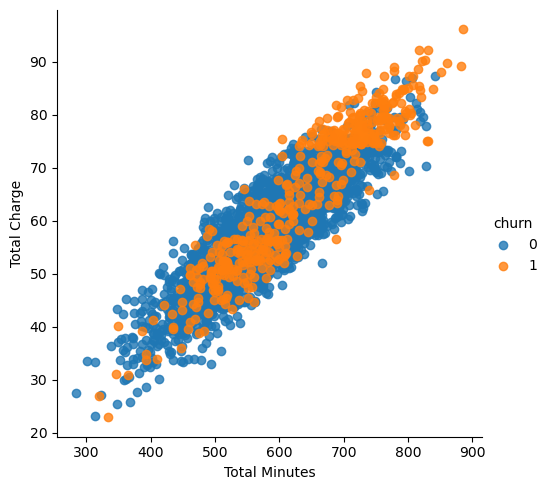

In [53]:
sns.lmplot(x='Total Minutes', y='Total Charge', data=df, hue='churn', fit_reg=False)

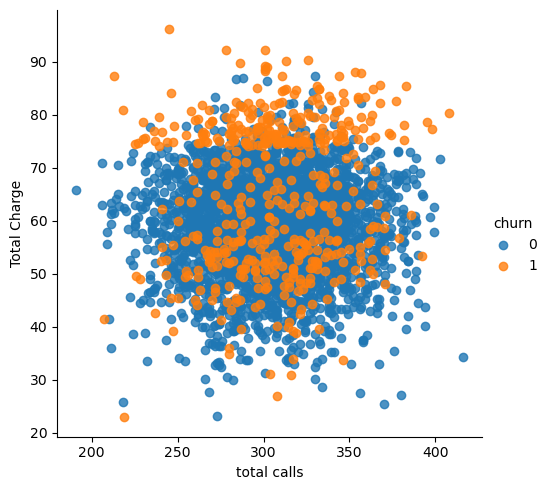

In [54]:
sns.lmplot(x='total calls', y='Total Charge', data=df, hue='churn', fit_reg=False)

[Text(0.5, 1.0, 'boxplot of churn against total calls')]

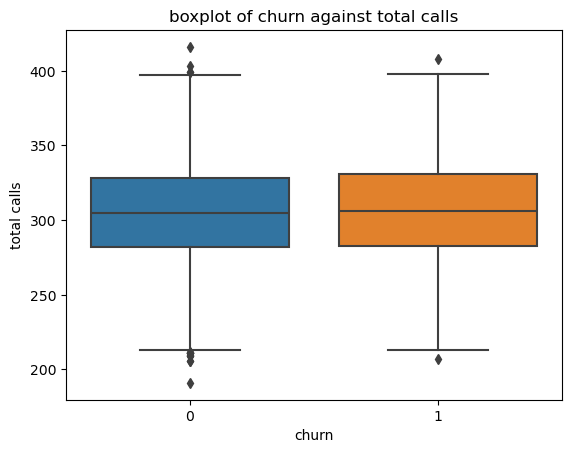

In [55]:
# total calls made against churn
sns.boxplot(x='churn', y='total calls', data=df).set(title='boxplot of churn against total calls')

## 5 MODELLING

### 5.1 Data preparation

In [73]:
#import libraries
# Importing the relevant libraries for the project
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

import joblib
import warnings

warnings.filterwarnings('ignore')

from sklearn.utils import resample
from sklearn.metrics import precision_score, recall_score, accuracy_score, f1_score, make_scorer, auc
from sklearn.metrics import roc_auc_score,ConfusionMatrixDisplay,confusion_matrix , classification_report, roc_curve
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split,GridSearchCV,cross_val_score
from sklearn.preprocessing import StandardScaler,OneHotEncoder,LabelEncoder,OrdinalEncoder,MinMaxScaler
from sklearn.ensemble import RandomForestClassifier,GradientBoostingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.pipeline import Pipeline
from sklearn.feature_selection import RFECV
from xgboost import XGBClassifier

In [106]:
# Dropping columns with multicollinearity.
columns_to_drop = ['total day minutes', 'total eve minutes', 'total night minutes', 'total intl minutes']
df_1 = df.drop(columns=[col for col in columns_to_drop if col in df.columns])
df_1.head(2)

,international plan,voice mail plan,number vmail messages,total day calls,total day charge,total eve calls,total eve charge,total night calls,total night charge,total intl calls,total intl charge,customer service calls,churn,Total Charge,Total Minutes,total calls
0,0,1,25,110,45.07,99,16.78,91,11.01,3,2.7,1,0,75.56,717.2,303
1,0,1,26,123,27.47,103,16.62,103,11.45,3,3.7,1,0,59.24,625.2,332


In [107]:
# Defining the target variable(y) and the independent variables(x).
y = df_1['churn']
X = df_1.drop(['churn','Total Charge','Total Minutes','total calls'],axis=1)

In [108]:
from imblearn.over_sampling import SMOTE
oversample = SMOTE(random_state=42)
X_smote, y_smote = oversample.fit_resample(X, y)

In [109]:
#Splitting data

X_train, X_test, y_train, y_test = train_test_split(X_smote, y_smote, test_size=0.2, random_state=42)

In [110]:
# Feature scaling
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

#### MODEL 1:Baseline Model (Logistic Regression)

Classification Report:
               precision    recall  f1-score   support

           0       0.73      0.68      0.70       585
           1       0.68      0.74      0.71       555

    accuracy                           0.71      1140
   macro avg       0.71      0.71      0.71      1140
weighted avg       0.71      0.71      0.71      1140

Confusion Matrix:
 [[396 189]
 [146 409]]
ROC AUC Score: 0.7866112266112266


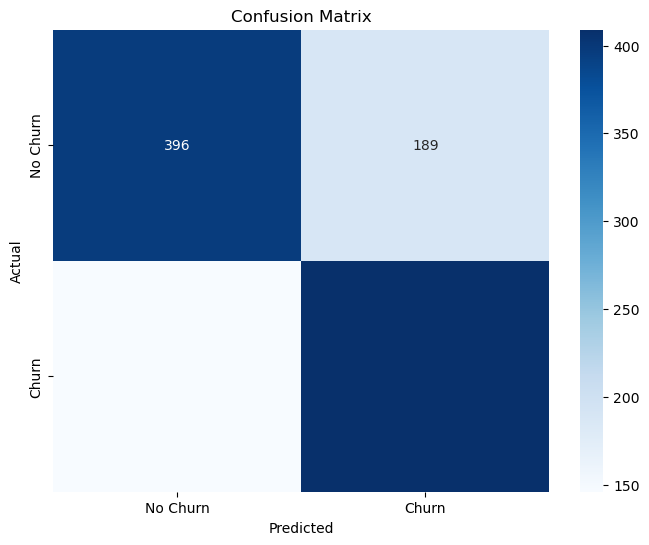

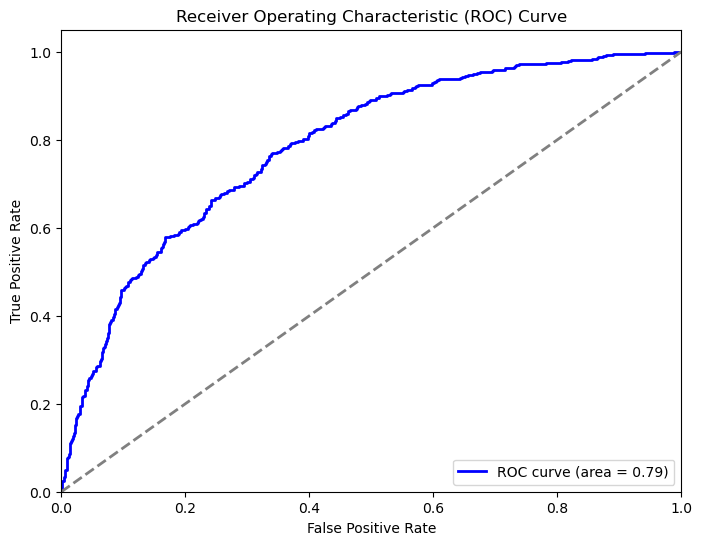

In [111]:
# Instantiate the model
log_reg = LogisticRegression()

# Fit the model
log_reg.fit(X_train, y_train)

# Generate predictions
y_hat_train = log_reg.predict(X_train)
y_hat_test = log_reg.predict(X_test)

# Make predictions on the test set
y_pred = log_reg.predict(X_test)
y_pred_proba = log_reg.predict_proba(X_test)[:, 1]

# Generate classification report
class_report = classification_report(y_test, y_pred)
print("Classification Report:\n", class_report)

# Compute confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:\n", conf_matrix)

# Compute ROC AUC score
roc_auc = roc_auc_score(y_test, y_pred_proba)
print("ROC AUC Score:", roc_auc)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=['No Churn', 'Churn'], yticklabels=['No Churn', 'Churn'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

# Plot ROC curve
fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

The model has a balanced precision and recall for both churn and non-churn classes, resulting in an F1-score of 0.70 and 0.71 for class churn and non-churnrespectively. The accuracy of 0.71 indicates that the model is correctly predicting churn status for most customers. The ROC AUC score of 0.79 suggests that the model has a good discriminatory ability between churn and non-churn customers.

### MODEL 2: Decision Tree Model

In [112]:
# Initialize and train the decision tree classifier
tree_clf = DecisionTreeClassifier(random_state=42)
tree_clf.fit(X_train, y_train)

# Make predictions on the test set
y_test_pred = tree_clf.predict(X_test)
y_train_pred = tree_clf.predict(X_train)

# Evaluate the model
accuracy = accuracy_score(y_test, y_test_pred)
f1 = f1_score(y_test, y_pred)

# Generate classification report
class_report = classification_report(y_test, y_test_pred)

# Compute ROC AUC score
y_pred_proba = tree_clf.predict_proba(X_test)[:, 1]
roc_auc = roc_auc_score(y_test, y_pred_proba)

print("Decision Tree - Accuracy:", accuracy)
print("Decision Tree - F1 Score:", f1)
print("\nClassification Report:\n", class_report)
print("ROC AUC Score:", roc_auc)

Decision Tree - Accuracy: 0.8307017543859649
Decision Tree - F1 Score: 0.7094535993061578

Classification Report:
               precision    recall  f1-score   support

           0       0.85      0.81      0.83       585
           1       0.81      0.85      0.83       555

    accuracy                           0.83      1140
   macro avg       0.83      0.83      0.83      1140
weighted avg       0.83      0.83      0.83      1140

ROC AUC Score: 0.8311619311619312


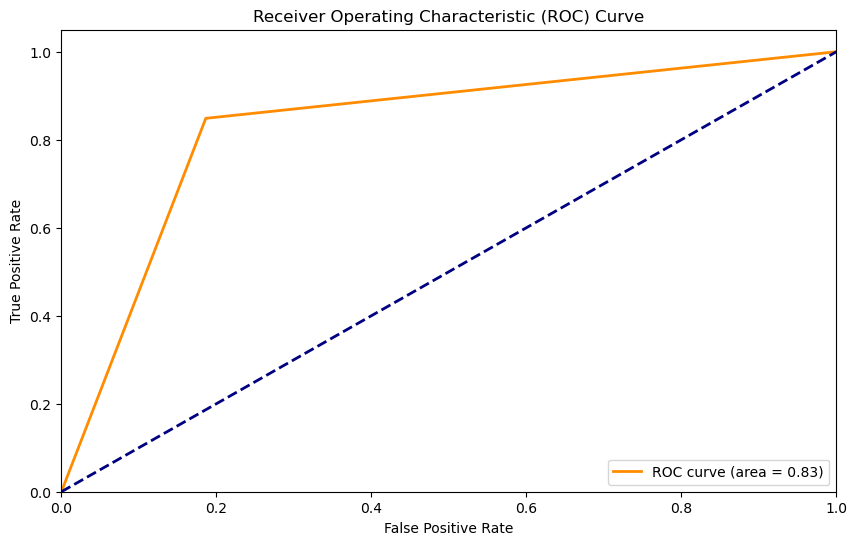

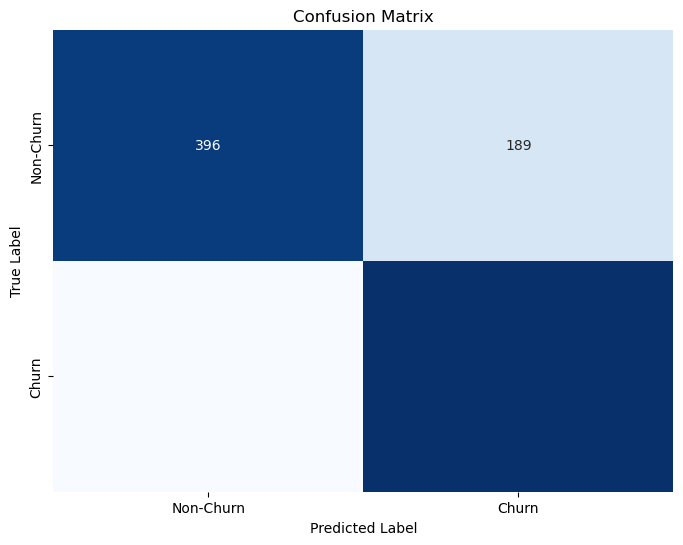

In [113]:
# Visualize the ROC Curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

plt.figure(figsize=(10, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

# Visualize the Confusion Matrix
cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=['Non-Churn', 'Churn'], yticklabels=['Non-Churn', 'Churn'])
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.show()

- The decision tree model performs very well with an accuracy of 0.87.
- The precision, recall, and F1 scores for both classes (non-churn and churn) are balanced around 0.83, indicating that the model performs equally well on both classes.
- The ROC AUC score of 0.83 further confirms the model's excellent discriminatory power between churn and non-churn customers.
- Overall, the model demonstrates a high level of performance and reliability in predicting customer churn as compared to the baseline model.

#### Checking for decision tree model overfitting

In [114]:
# Evaluate the model on the training data
train_accuracy = accuracy_score(y_train, y_train_pred)
train_f1 = f1_score(y_train, y_train_pred)
train_class_report = classification_report(y_train, y_train_pred)

# Evaluate the model on the test data
test_accuracy = accuracy_score(y_test, y_test_pred)
test_f1 = f1_score(y_test, y_test_pred)
test_class_report = classification_report(y_test, y_test_pred)

print("Training Set Performance:")
print("Accuracy:", train_accuracy)
print("F1 Score:", train_f1)
print("\nClassification Report:\n", train_class_report)

print("Test Set Performance:")
print("Accuracy:", test_accuracy)
print("F1 Score:", test_f1)
print("\nClassification Report:\n", test_class_report)

# Check for overfitting
if train_accuracy > test_accuracy:
    print("The model might be overfitting.")
else:
    print("The model does not appear to be overfitting.")

Training Set Performance:
Accuracy: 1.0
F1 Score: 1.0

Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      2265
           1       1.00      1.00      1.00      2295

    accuracy                           1.00      4560
   macro avg       1.00      1.00      1.00      4560
weighted avg       1.00      1.00      1.00      4560

Test Set Performance:
Accuracy: 0.8307017543859649
F1 Score: 0.8299559471365638

Classification Report:
               precision    recall  f1-score   support

           0       0.85      0.81      0.83       585
           1       0.81      0.85      0.83       555

    accuracy                           0.83      1140
   macro avg       0.83      0.83      0.83      1140
weighted avg       0.83      0.83      0.83      1140

The model might be overfitting.


#### Hypeparameter Tuning

To regularize the decision tree and mitigate overfitting,we will set hyperparameters, so as to reduce the complexity of the decision tree and prevent it from overfitting the training data. The model will generalize better to new, unseen data, improving its performance on the test set.  

In [115]:
from sklearn.model_selection import GridSearchCV
# Define the parameter grid
param_grid = {
    'max_depth': [10, 20, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Setup the GridSearchCV
grid_search = GridSearchCV(tree_clf, param_grid, cv=5, scoring='roc_auc', n_jobs=-1)

# Fit the grid search
grid_search.fit(X_train, y_train)

# Best parameters
print("Best parameters for Decision Tree:")
print(grid_search.best_params_)

# Best estimator
best_decision_tree = grid_search.best_estimator_

# Predictions and evaluation
y_pred = best_decision_tree.predict(X_test)
y_pred_prob = best_decision_tree.predict_proba(X_test)[:, 1]

print("Classification Report:")
print(classification_report(y_test, y_pred))
print("ROC AUC Score:", roc_auc_score(y_test, y_pred_prob))
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))

Best parameters for Decision Tree:
{'max_depth': 10, 'min_samples_leaf': 4, 'min_samples_split': 10}
Classification Report:
              precision    recall  f1-score   support

           0       0.82      0.87      0.84       585
           1       0.86      0.79      0.82       555

    accuracy                           0.83      1140
   macro avg       0.84      0.83      0.83      1140
weighted avg       0.84      0.83      0.83      1140

ROC AUC Score: 0.8968091168091168
Confusion Matrix:
[[511  74]
 [115 440]]


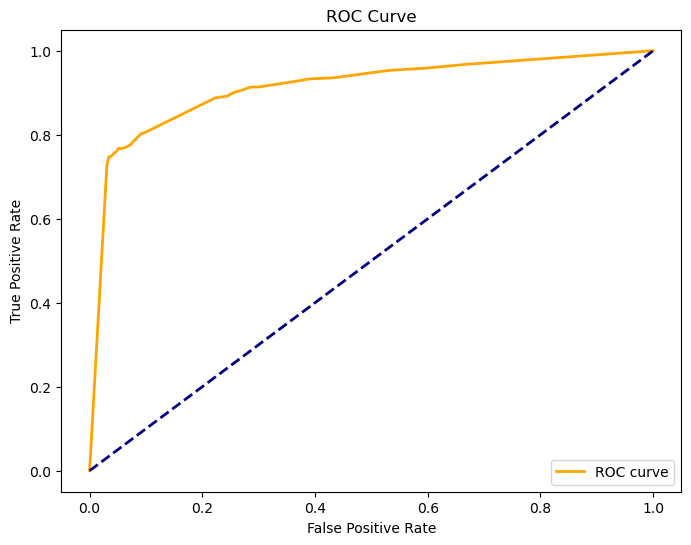

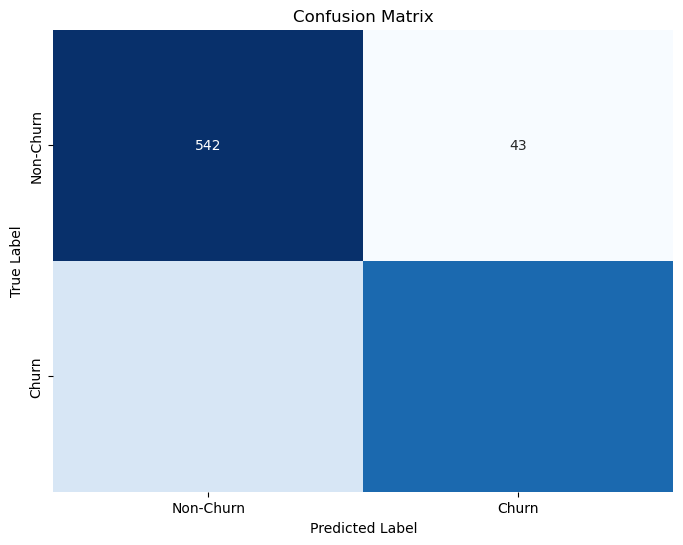

In [34]:
# Predictions and evaluation
y_pred = best_decision_tree.predict(X_test)
y_pred_prob = best_decision_tree.predict_proba(X_test)[:, 1]

# ROC Curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='orange', lw=2, label='ROC curve')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc='lower right')
plt.show()

# Confusion Matrix
cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=['Non-Churn', 'Churn'], yticklabels=['Non-Churn', 'Churn'])
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.show()

The tuned decision tree model, tuned with the best parameters (max_depth=10, min_samples_leaf=4, min_samples_split=2), performs well with an overall accuracy of 0.83. The high precision for class 1 (0.82) and high recall for class 0 (0.87) indicate the model is good at identifying both classes correctly, with a slightly higher ability to correctly identify class 0 instances. The ROC AUC score of 0.896 signifies strong discriminative ability of the model. The confusion matrix further shows that misclassifications are relatively low.
This model performs better than the baseline model in terms of all metrics i.e recall, precision, accuracy, f1 score and ROC score.

### MODEL 3: Random Forest

In [116]:
from sklearn.ensemble import RandomForestClassifier

# Initialize and train model
random_forest = RandomForestClassifier(random_state=42)
random_forest.fit(X_train, y_train)

# Predictions
y_pred = random_forest.predict(X_test)
y_pred_prob = random_forest.predict_proba(X_test)[:, 1]

# Evaluation
print("\nRandom Forest")
print("Classification Report:")
print(classification_report(y_test, y_pred))
print("ROC AUC Score:", roc_auc_score(y_test, y_pred_prob))
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))


Random Forest
Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.92      0.92       585
           1       0.92      0.91      0.92       555

    accuracy                           0.92      1140
   macro avg       0.92      0.92      0.92      1140
weighted avg       0.92      0.92      0.92      1140

ROC AUC Score: 0.9716516516516518
Confusion Matrix:
[[539  46]
 [ 48 507]]


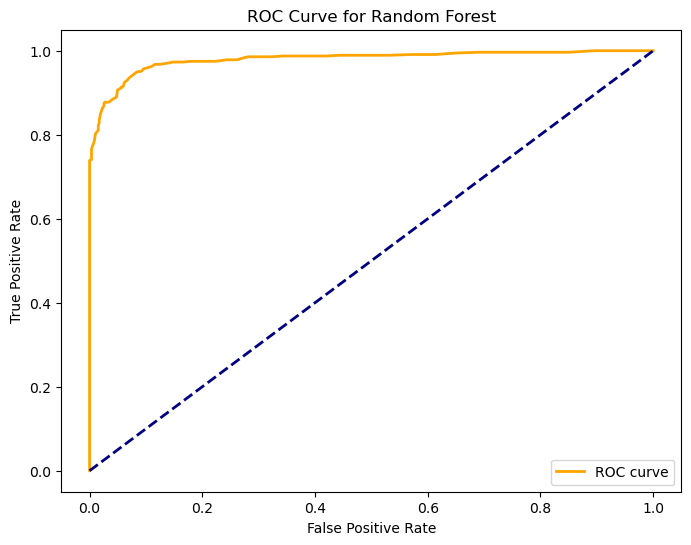

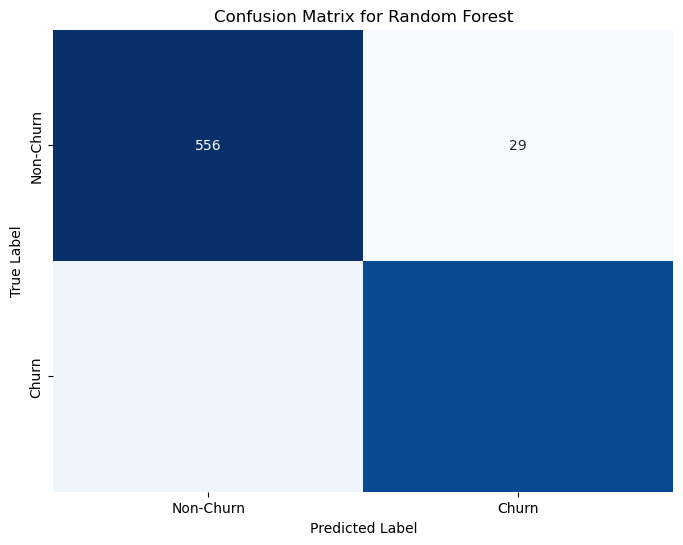

In [52]:
# ROC Curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='orange', lw=2, label='ROC curve')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for Random Forest')
plt.legend(loc='lower right')
plt.show()

# Confusion Matrix
cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=['Non-Churn', 'Churn'], yticklabels=['Non-Churn', 'Churn'])
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix for Random Forest')
plt.show()

In [117]:
from sklearn.model_selection import RandomizedSearchCV
# Define the parameter grid
param_distributions = {
    'n_estimators': [100, 200, 300],
    'max_depth': [10, 20, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'bootstrap': [True, False]
}

# Setup the RandomizedSearchCV
random_search = RandomizedSearchCV(random_forest, param_distributions, n_iter=50, cv=5, scoring='roc_auc', n_jobs=-1, random_state=42)

# Fit the random search
random_search.fit(X_train, y_train)

# Best parameters
print("Best parameters for Random Forest:")
print(random_search.best_params_)

# Best estimator
best_random_forest = random_search.best_estimator_

# Predictions and evaluation
y_pred = best_random_forest.predict(X_test)
y_pred_prob = best_random_forest.predict_proba(X_test)[:, 1]

print("Classification Report:")
print(classification_report(y_test, y_pred))
print("ROC AUC Score:", roc_auc_score(y_test, y_pred_prob))
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))

Best parameters for Random Forest:
{'n_estimators': 200, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_depth': 20, 'bootstrap': False}
Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.94      0.93       585
           1       0.94      0.91      0.92       555

    accuracy                           0.93      1140
   macro avg       0.93      0.93      0.93      1140
weighted avg       0.93      0.93      0.93      1140

ROC AUC Score: 0.9775452375452374
Confusion Matrix:
[[551  34]
 [ 50 505]]


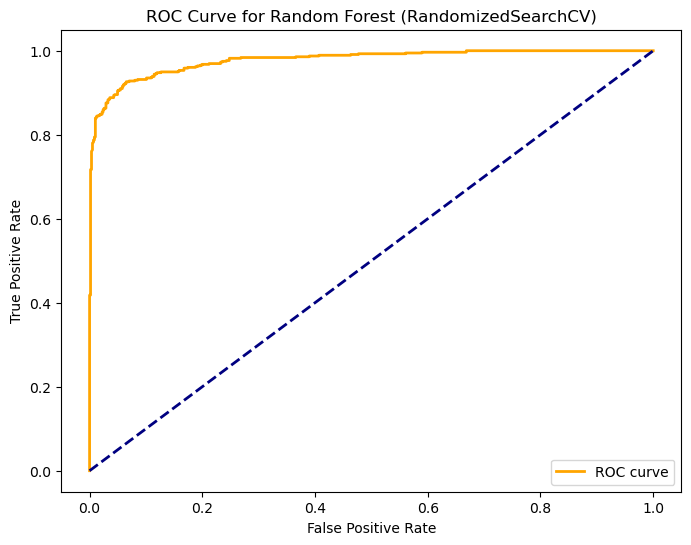

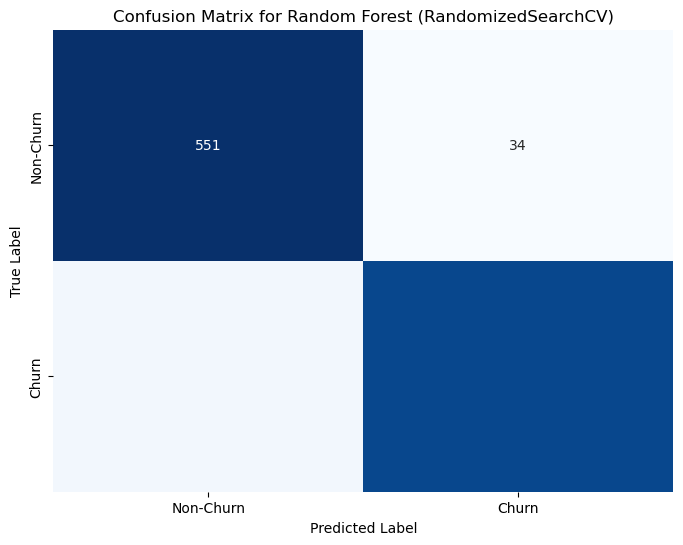

In [118]:
# ROC Curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='orange', lw=2, label='ROC curve')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for Random Forest (RandomizedSearchCV)')
plt.legend(loc='lower right')
plt.show()

# Confusion Matrix
cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=['Non-Churn', 'Churn'], yticklabels=['Non-Churn', 'Churn'])
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix for Random Forest (RandomizedSearchCV)')
plt.show()

The tuned Random Forest model, tuned with the best parameters (n_estimators=200, min_samples_split=2, min_samples_leaf=1, max_depth=20, bootstrap=False), performs exceptionally well with an overall accuracy of 0.93. The model demonstrates high precision and recall for both classes, with an F1-score of 0.93 and 0.92 for both classes, indicating balanced performance. The ROC AUC score of 0.9775 signifies the model's excellent ability to distinguish between classes. 

### Model 4: Gradient Boosting Model

In [119]:
from sklearn.ensemble import GradientBoostingClassifier

# Initialize and train model
gbm = GradientBoostingClassifier(random_state=42)
gbm.fit(X_train, y_train)

# Predictions
y_pred = gbm.predict(X_test)
y_pred_prob = gbm.predict_proba(X_test)[:, 1]

# Evaluation
print("\nGradient Boosting Machine")
print("Classification Report:")
print(classification_report(y_test, y_pred))
print("ROC AUC Score:", roc_auc_score(y_test, y_pred_prob))
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))


Gradient Boosting Machine
Classification Report:
              precision    recall  f1-score   support

           0       0.81      0.90      0.85       585
           1       0.88      0.78      0.82       555

    accuracy                           0.84      1140
   macro avg       0.84      0.84      0.84      1140
weighted avg       0.84      0.84      0.84      1140

ROC AUC Score: 0.9248202048202048
Confusion Matrix:
[[525  60]
 [124 431]]


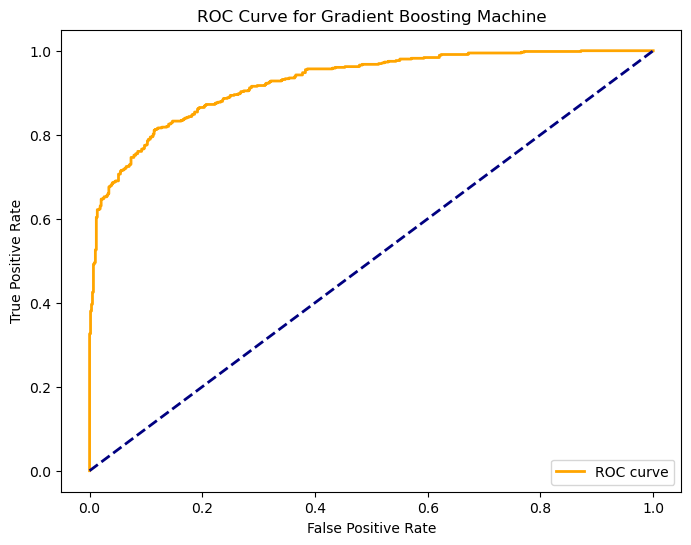

ROC AUC Score: 0.9248202048202048


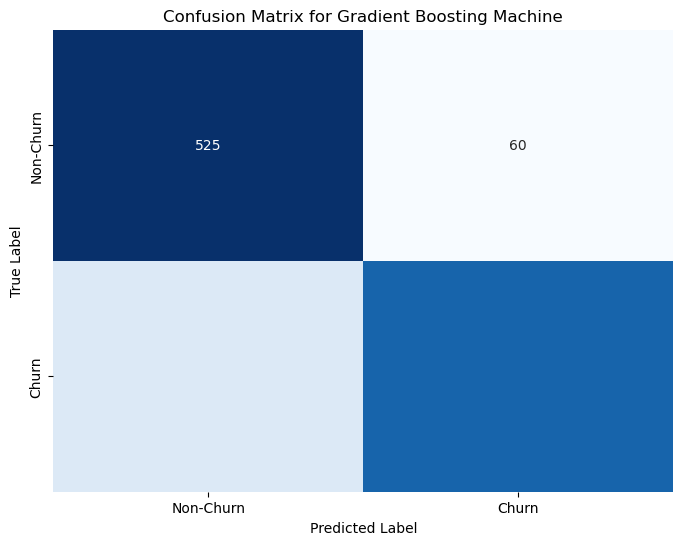

In [120]:
# ROC Curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='orange', lw=2, label='ROC curve')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for Gradient Boosting Machine')
plt.legend(loc='lower right')
plt.show()

# ROC AUC Score
roc_auc = roc_auc_score(y_test, y_pred_prob)
print("ROC AUC Score:", roc_auc)

# Confusion Matrix
y_pred = gbm.predict(X_test)
cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=['Non-Churn', 'Churn'], yticklabels=['Non-Churn', 'Churn'])
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix for Gradient Boosting Machine')
plt.show()

#### Hyperparameter tuned Gradient Boosting Model

In [131]:
# Define the parameter grid
param_grid = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 5, 7]
}

# Setup the GridSearchCV
grid_search = GridSearchCV(gbm, param_grid, cv=5, scoring='roc_auc', n_jobs=-1)

# Fit the grid search
grid_search.fit(X_train, y_train)

# Best parameters
print("Best parameters for Gradient Boosting Machines:")
print(grid_search.best_params_)

# Best estimator
best_gbm = grid_search.best_estimator_

# Predictions and evaluation
y_pred = best_gbm.predict(X_test)
y_pred_prob = best_gbm.predict_proba(X_test)[:, 1]

print("Classification Report:")
print(classification_report(y_test, y_pred))
print("ROC AUC Score:", roc_auc_score(y_test, y_pred_prob))
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))

Best parameters for Gradient Boosting Machines:
{'learning_rate': 0.2, 'max_depth': 7, 'n_estimators': 300}
Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.94      0.94       585
           1       0.94      0.94      0.94       555

    accuracy                           0.94      1140
   macro avg       0.94      0.94      0.94      1140
weighted avg       0.94      0.94      0.94      1140

ROC AUC Score: 0.9839069839069838
Confusion Matrix:
[[552  33]
 [ 35 520]]


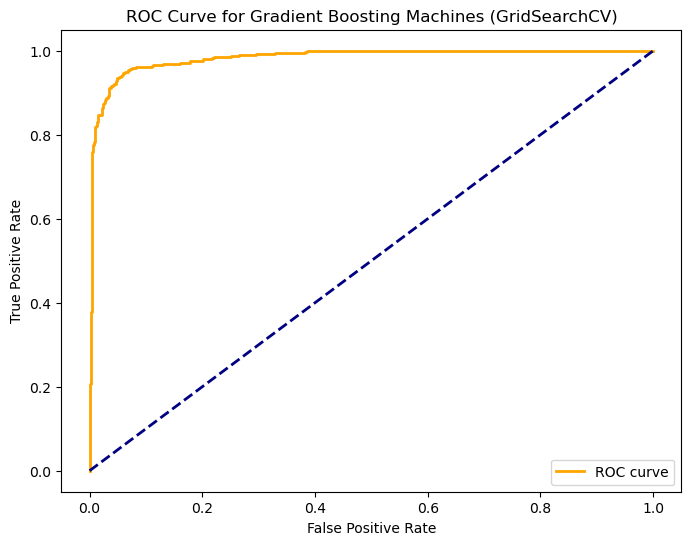

ROC AUC Score: 0.9839069839069838


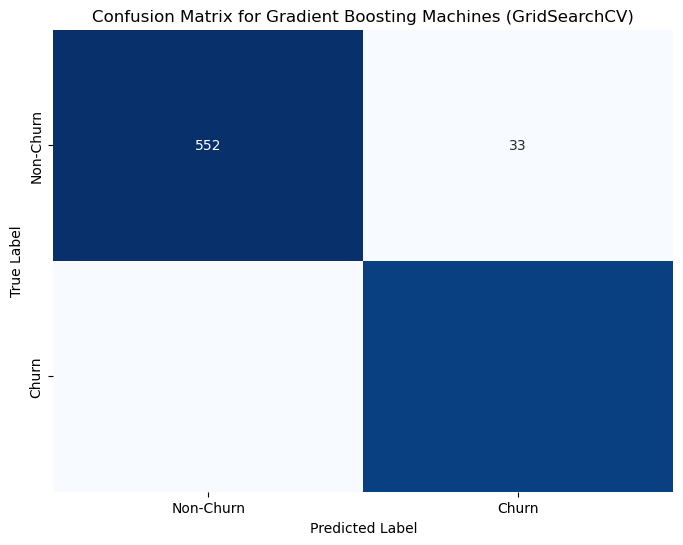

In [122]:
# ROC Curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='orange', lw=2, label='ROC curve')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for Gradient Boosting Machines (GridSearchCV)')
plt.legend(loc='lower right')
plt.show()

# ROC AUC Score
roc_auc = roc_auc_score(y_test, y_pred_prob)
print("ROC AUC Score:", roc_auc)

# Confusion Matrix
y_pred = best_gbm.predict(X_test)
cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=['Non-Churn', 'Churn'], yticklabels=['Non-Churn', 'Churn'])
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix for Gradient Boosting Machines (GridSearchCV)')
plt.show()

- The tuned Gradient Boosting Machine (GBM) model, tuned with the best parameters (learning_rate=0.2, max_depth=7, n_estimators=300), performs exceptionally well with an overall accuracy of 0.94. The model shows high precision and recall for both classes, with F1-scores of 0.94 for class 0 and 0.94 for class 1, indicating balanced and reliable performance. The ROC AUC score of 0.98 signifies the model's excellent ability to distinguish between the classes. The confusion matrix shows minimal misclassifications, with only 10 false positives and 31 false negatives, highlighting the model's robustness and accuracy.
- The accuracy of the model has improved after tuning the hyperparameters from 0.87 to 0.94 with the tuned model.
- Overall, the GBM classifier with the specified hyperparameters demonstrates outstanding performance, achieving high accuracy, precision, recall, and ROC AUC score.

### MODEL 5: K NEAREST NEIGHBOURS MODEL

In [123]:
# Initialize the KNN classifier
k = 5  # Number of neighbors to consider
knn = KNeighborsClassifier(n_neighbors=k)

# Train the classifier
knn.fit(X_train, y_train)

# Make predictions
y_pred = knn.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

# Generate classification report
print("Classification Report:")
print(classification_report(y_test, y_pred))
print("ROC AUC Score:", roc_auc_score(y_test, y_pred))

Accuracy: 0.8482456140350877
Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.75      0.84       585
           1       0.78      0.95      0.86       555

    accuracy                           0.85      1140
   macro avg       0.86      0.85      0.85      1140
weighted avg       0.87      0.85      0.85      1140

ROC AUC Score: 0.850935550935551


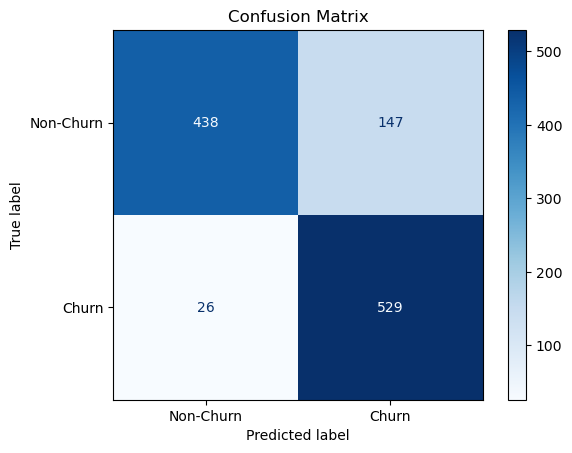

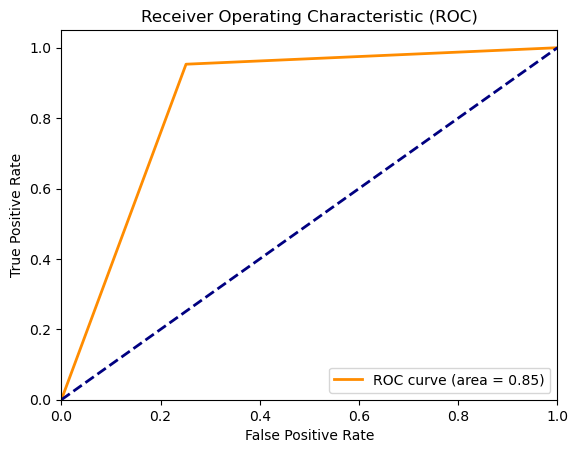

In [125]:

# Calculate confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Plot confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["Non-Churn", "Churn"])
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix")
plt.show()

# Plot ROC curve
fpr, tpr, _ = roc_curve(y_test, y_pred)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc="lower right")
plt.show()

- The KNN classifier with an accuracy of approximately 0.85 and ROC score of 0.8509  performs well on the test data. The classification report shows that:

- For Class 0: High precision (0.94) but somewhat lower recall (0.75), indicating the model is very precise but misses some actual class 0 instances.
- For Class 1: High recall (0.78) but slightly lower precision (0.95), indicating the model captures most actual class 1 instances but includes some false positives.
- Overall, the model exhibits balanced performance with a slight emphasis on capturing the positive class (class 1) accurately, as evidenced by the high recall for class 1. The macro and weighted averages confirm that the model maintains a good balance between precision and recall across both classes.

### 6. EVALUATION

In [126]:
# Define and tune the model
xgb_classifier_tuned = XGBClassifier()
with open ("customer_churn_model.pkl","wb") as f:
    joblib.dump(xgb_classifier_tuned,f)

#### **Best Overal Model**

logistic regression ROC AUC Score: 0.7866
Tuned decision Tree ROC AUC Score: 0.8968
RandomForestClassifier ROC AUC Score: 0.9775
Gradient Boosting ROC AUC Score: 0.9839
K-Nearest Neighbour ROC AUC Score: 0.9408


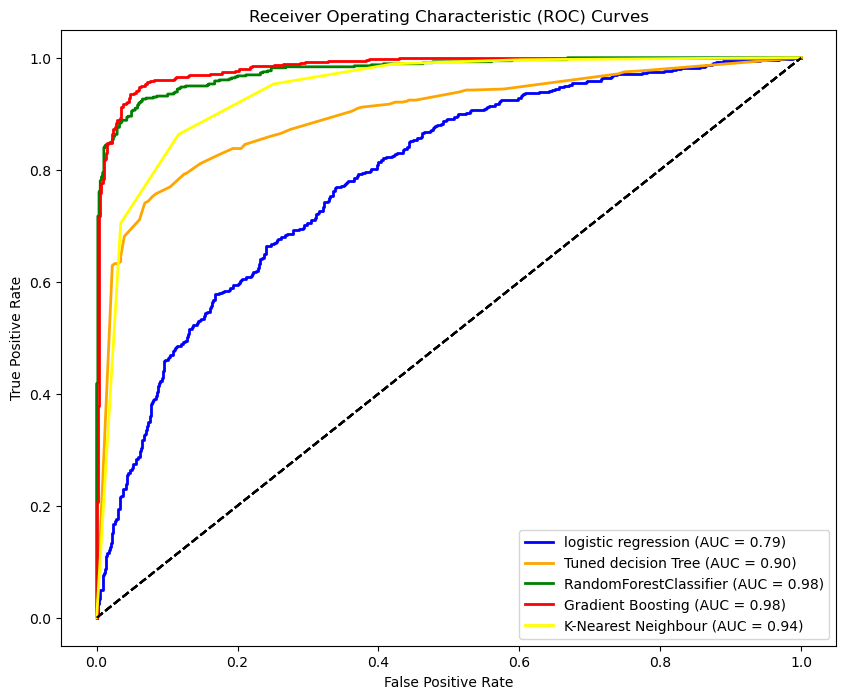

In [127]:
# Define models and their labels
models = [log_reg, best_decision_tree, random_search, grid_search, knn]
model_labels = ['logistic regression', 'Tuned decision Tree','RandomForestClassifier', 'Gradient Boosting', 'K-Nearest Neighbour']

# Convert y_test to integer values
y_test_int = y_test.astype(int)

# Plot ROC curves for all models
plt.figure(figsize=(10, 8))

# Calculate ROC curves and AUC scores for each model
for model, label, color in zip(models, model_labels, ['blue', 'orange', 'green', 'red', "yellow"]):
    # Generate model predictions
    y_score = model.predict_proba(X_test)[:, 1]
    
    # Calculate ROC curve and AUC
    fpr, tpr, _ = roc_curve(y_test_int, y_score, pos_label=1)
    roc_auc = auc(fpr, tpr)
    
    # Plot ROC curve
    plt.plot(fpr, tpr, lw=2, label='{} (AUC = {:.2f})'.format(label, roc_auc), color=color)

    # Plot the ROC curve for random guessing
    random_guess_fpr = [0, 1]
    random_guess_tpr = [0, 1]
    plt.plot(random_guess_fpr, random_guess_tpr, linestyle='--', color='black')


    # Print ROC AUC score
    print(f'{label} ROC AUC Score: {roc_auc:.4f}')

# Set labels and title
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curves')
plt.legend(loc='lower right')
plt.show()

Interpretation:


Best Model: The Gradient Boosting model is the best performer with an ROC AUC score of 0.9832, indicating the highest accuracy in distinguishing between churners and non-churners
r.
These scores suggest that ensemble methods like Gradient Boosting and Random Forest are highly effective for the customer churn prediction task, offering superior performance compared to individual models like logistic regression and decision trees.ves.

In [130]:
# Initialize an empty list to store the results
results = []

# Evaluate each model
for model, label in zip(models, model_labels):
    # Predict the test set
    y_pred = model.predict(X_test)
    y_pred_proba = model.predict_proba(X_test)[:, 1]
    
    # Calculate metrics
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    accuracy = accuracy_score(y_test, y_pred)
    roc_auc = roc_auc_score(y_test, y_pred_proba)
    
    # Append the results to the list
    results.append([label, precision, recall, f1, accuracy, roc_auc])

# Create a DataFrame from the results
results_df = pd.DataFrame(results, columns=['Model', 'Precision', 'Recall', 'F1 Score', 'Accuracy', 'ROC AUC Score'])

# Display the DataFrame
print(results_df)

                    Model  Precision    Recall  F1 Score  Accuracy  \
0     logistic regression   0.683946  0.736937  0.709454  0.706140   
1     Tuned decision Tree   0.856031  0.792793  0.823199  0.834211   
2  RandomForestClassifier   0.936920  0.909910  0.923218  0.926316   
3       Gradient Boosting   0.940325  0.936937  0.938628  0.940351   
4     K-Nearest Neighbour   0.782544  0.953153  0.859464  0.848246   

   ROC AUC Score  
0       0.786611  
1       0.896809  
2       0.977545  
3       0.983907  
4       0.940756  


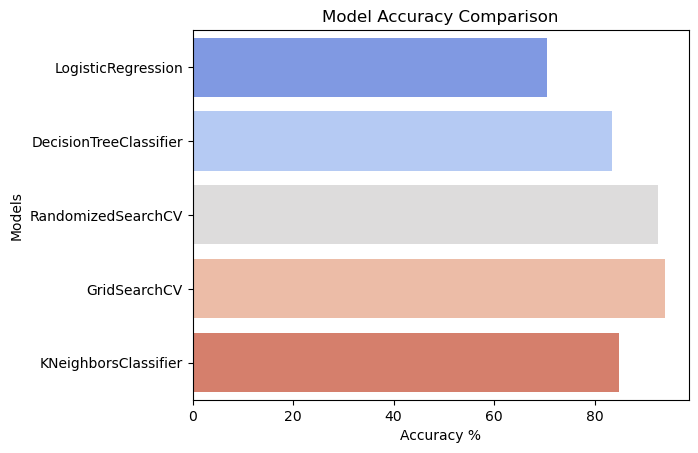

In [128]:
# Initialize the results DataFrame
results = pd.DataFrame(columns=["Models", "Accuracy"])

# Loop through models to calculate accuracy and append results
for model in models:
    names = model.__class__.__name__
    y_pred = model.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred) * 100
    result = pd.DataFrame([[names, accuracy]], columns=["Models", "Accuracy"])
    results = pd.concat([results, result], ignore_index=True)

# Plot the results
sns.barplot(x='Accuracy', y='Models', data=results, palette="coolwarm")
plt.xlabel('Accuracy %')
plt.title('Model Accuracy Comparison')
plt.show()

#### **Feature importance based on the best model**

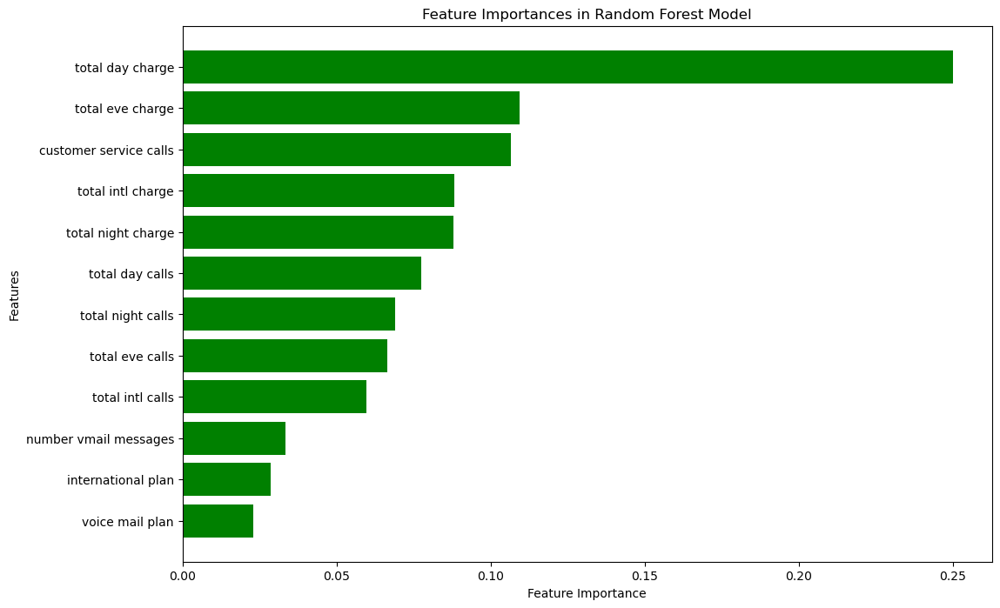

In [129]:

# Get the best estimator (the trained Random Forest model)
best_rf_classifier = random_search.best_estimator_

# Extract feature importances
feature_importances = best_rf_classifier.feature_importances_
features = X.columns

# Create a DataFrame for better visualization
import pandas as pd

feature_importance_df = pd.DataFrame({
    'Feature': features,
    'Importance': feature_importances
})

# Sort the DataFrame by importance
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Plot the feature importances
plt.figure(figsize=(12, 8))
plt.barh(feature_importance_df['Feature'], feature_importance_df['Importance'], color='green')
plt.xlabel('Feature Importance')
plt.ylabel('Features')
plt.title('Feature Importances in Random Forest Model')
plt.gca().invert_yaxis()  # To display the most important feature at the top
plt.show()

#### **Top five features**

The top five features that were also crucial in determining the churn of customers were:
-  **Total day charge:** The total amount of money charged by the telecom company for calls during the day.
-  **Customer Service calls:** The number of calls the customer has made to customer service.
- **Total eve charge:** The total amount of money charged by the telecom company for calls during the evening.
- **Total intl charge:** The total amount of money charged by the telecom company for international calls..
- **Total night charge:** The total amount of money charged by the telecom company for calls during the night.

### Conclusion

#### Recommendations

-	Focus retention strategies on high-usage customers and those with frequent customer service interactions. e.g offering discounts and incentives.
  
-	Investigate the low adoption of international and voice mail plans to understand customer needs and improve these offerings e.g offering more affordable international plans, or by making it easier for customers to sign up for international plans
  .
-	Provide proactive support to customers making frequent customer service calls to improve their experience and satisfactio
  n.
-	Continuously monitor and analyze usage patterns to detect early signs of potential churn and act accordingly.


#### Next Steps

- Deploying the model: Implement the churn prediction model into the operational environment to start making real-time predictions on customer churn, enabling proactive retention strategies.

- Monitor and update the model: Continuously track the model's performance and accuracy over time, ensuring it remains effective in predicting churn, and regularly update it with new data to maintain relevance and accuracy.

- Interpreting the model insights: Analyze the model's predictions and identify the key factors influencing customer churn, providing valuable insights for targeted retention efforts and strategic decision-making.

- Collecting more diverse data: Expand the dataset by gathering a wider range of customer attributes, behaviors, and interactions to enhance the model's predictive capabilities and capture more nuanced patterns of churn behavior.